In [ ]:
from astropy.io import fits
import matplotlib
matplotlib.get_backend()
import matplotlib.pyplot as plt
import os
from matplotlib.colors import LogNorm
directory = '/Users/shaydamoezzi/Documents/FITS_files/'
headerValues = {}
for filename in os.listdir(directory):
    if filename.endswith(".fits"):
        hdulist = fits.open(directory + filename)
        #hdulist.info()
        hdu = hdulist[0]
        headerValues[filename] = hdu.header
        continue
    else:
        continue     

In [ ]:
noiseValues = []
for key in headerValues:
    try:
        hdu = headerValues[key]
        noiseValues.append(hdu['NOISE'])
        #print(key + ':' )
        #print('     ', hdu['NOISE'])
    except KeyError: 
        continue         

In [ ]:
noiseValues.sort()
lastIndex = -1
for i in noiseValues:
    lastIndex = lastIndex + 1
greatestSDEV = noiseValues[lastIndex]

noiseImage = ''

for key in headerValues:
    hdu = headerValues[key]
    try: 
        if greatestSDEV == hdu['NOISE']:
            noiseImage = key
        else:
            continue
    except KeyError:
        continue
        
print("File with highest noise value: " + noiseImage)      

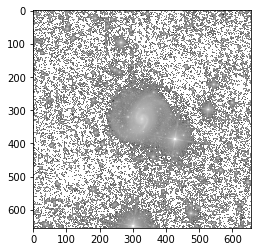

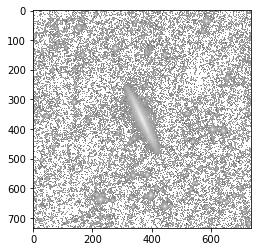

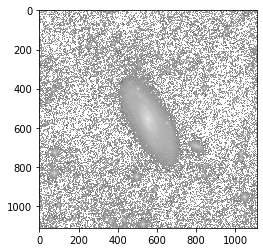

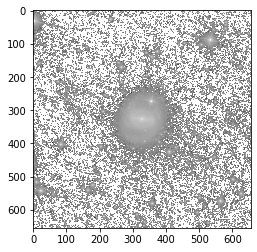

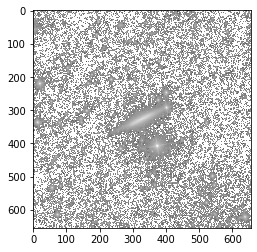

...

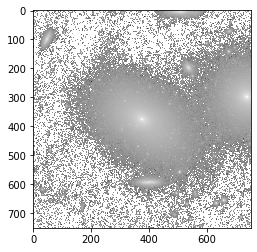

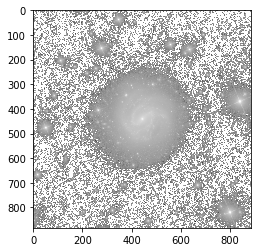

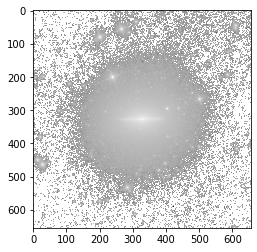

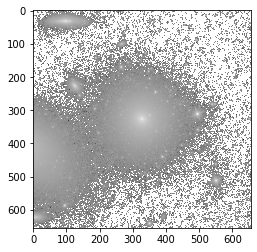

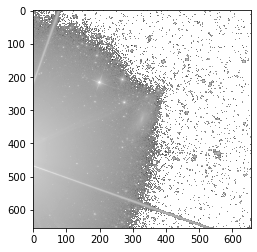

CPU times: user 1min 3s, sys: 6.04 s, total: 1min 9s
Wall time: 1min 39s


In [71]:
%%time
#cell execution time when running locally: 1min 39s
for i in noiseValues:
     for key in headerValues:
            hdu = headerValues[key]
            try: 
                if i == hdu['NOISE']:
                    image_data = fits.getdata('/Users/shaydamoezzi/Documents/FITS_files/' + key)
                    plt.imshow(image_data, cmap='gray', norm=LogNorm())
                    plt.show()
            except KeyError:
                continue
